# ML 101. Учимся работе с данными — от загрузки до моделирования. EDA, kNN.

<a id="toc"></a>
# Содержание

* [Разведочный анализ данных](#eda)
 * [Загрузка и знакомство с данными](#load)
 * [Проверка полноты данных](#isna)
 * [Очистка](#cleanup)
 * [Статистики](#stats)
 * [Перекодировка целевой переменной](#enc)
 * [Визуальный анализ](#graph)
 * [Распределение целевой переменной](#targ_dist)
 * [Гистограммы](#hist)
 * [Корреляция](#corr)
   * [Тепловая карта корреляций](#heatmap)
   * [Попарно коррелирующие признаки](#pairwise)
   * [Признаки коррелирующие с диагнозом](#target_corr)
 * [Размахи](#boxes)
 * [Визуализация разделения признаков по классам](#swarms)
* [Классификация](#class)
 * [Нормализация данных](#norm)
 * [Разбиение данных на тестовую и обучающую выборки](#split)
 * [Стандартизация данных](#scale)
 * [Метрики](#code)
 * [kNN без подбора гиперпараметров](#naive)
 * [Подбор числа соседей с помощью кросс-валидации](#cv)
 * [Настройка гиперпараметров с помощью GridSearchCV](#gcv)

<a id="eda"></a>
# Разведочный анализ данных [⇑](#toc)

Признаками в исследуемом наборе данных являются различные измерения новообразований в груди, такие как радиус, симметричность, и т.д.<br>
Целевая переменная — диагноз, является ли новообразование злокачественным или нет.

In [286]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, classification_report, confusion_matrix, plot_confusion_matrix
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import GridSearchCV, train_test_split, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
warnings.filterwarnings("ignore")

np.random.seed(42)
np.set_printoptions(precision=3)

%matplotlib inline

<a id="load"></a>
### Загрузка и знакомство с данными [⇑](#toc)

In [56]:
df = pd.read_csv('data.csv')

In [57]:
df.shape

(569, 33)

In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [59]:
df[::100]

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
100,862717,M,13.61,24.98,88.05,582.7,0.09488,0.08511,0.08625,0.04489,...,35.27,108.60,906.5,0.1265,0.1943,0.3169,0.1184,0.2651,0.07397,NaN
200,877501,B,12.23,19.56,78.54,461.0,0.09586,0.08087,0.04187,0.04107,...,28.36,92.15,638.4,0.1429,0.2042,0.1377,0.1080,0.2668,0.08174,NaN
300,892438,M,19.53,18.90,129.50,1217.0,0.11500,0.16420,0.21970,0.10620,...,26.24,171.10,2053.0,0.1495,0.4116,0.6121,0.1980,0.2968,0.09929,NaN
400,90439701,M,17.91,21.02,124.40,994.0,0.12300,0.25760,0.31890,0.11980,...,27.78,149.60,1304.0,0.1873,0.5917,0.9034,0.1964,0.3245,0.11980,NaN
500,914862,B,15.04,16.74,98.73,689.4,0.09883,0.13640,0.07721,0.06142,...,20.43,109.70,856.9,0.1135,0.2176,0.1856,0.1018,0.2177,0.08549,NaN


<a id="isna"></a>
### Проверка полноты данных [⇑](#toc)

In [60]:
incomplete = df.isna().sum()
print(incomplete[incomplete > 0])

Unnamed: 32    569
dtype: int64


<a id="cleanup"></a>
### Очистка данных [⇑](#toc)
Итого имеем одну полностью не заполненную колонку — 'Unnamed: 32'.<br>
И ничего не значащий для классификации идентификатор исследования — 'id'.<br>
Удалим их, чтобы не мешали классификатору и не занимали лишнюю память.

In [61]:
# Удаляем ненужные колонки
df.drop(['Unnamed: 32','id'], axis = 1, inplace=True)

<a id="stats"></a>
### Статистики [⇑](#toc)

In [62]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400
fractal_dimension_mean,569.0,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.09744


In [63]:
df.describe(include=['object'])

,diagnosis
count,569
unique,2
top,B
freq,357


In [64]:
means = [col for col in df.columns if col.endswith('_mean')]
se = [col for col in df.columns if col.endswith('_se')]
worst = [col for col in df.columns if col.endswith('_worst')]

In [65]:
df.groupby(["diagnosis"])[means].agg([np.mean, np.std, np.min, np.max])

radius_mean                          texture_mean                   \
                 mean       std    amin   amax         mean       std   amin   
diagnosis                                                                      
B           12.146524  1.780512   6.981  17.85    17.914762  3.995125   9.71   
M           17.462830  3.203971  10.950  28.11    21.604906  3.779470  10.38   

                 perimeter_mean             ... concave points_mean           \
            amax           mean        std  ...                amin     amax   
diagnosis                                   ...                                
B          33.81      78.075406  11.807438  ...             0.00000  0.08534   
M          39.28     115.365377  21.854653  ...             0.02031  0.20120   

          symmetry_mean                           fractal_dimension_mean  \
                   mean       std    amin    amax                   mean   
diagnosis                                                                  
B              0.174186  0.024807  0.1060  0.2743               0.062867   
M              0.192909  0.027638  0.1308  0.3040               0.062680   

                                       
                std     amin     amax  
diagnosis                              
B          0.006747  0.05185  0.09575  
M          0.007573  0.04996  0.09744  

[2 rows x 40 columns]

In [66]:
df.groupby(["diagnosis"])[se].agg([np.mean, np.std, np.min, np.max])

radius_se                           texture_se                    \
               mean       std    amin    amax       mean       std    amin   
diagnosis                                                                    
B          0.284082  0.112570  0.1115  0.8811   1.220380  0.589180  0.3602   
M          0.609083  0.345039  0.1938  2.8730   1.210915  0.483178  0.3621   

                 perimeter_se            ... concave points_se           \
            amax         mean       std  ...              amin     amax   
diagnosis                                ...                              
B          4.885     2.000321  0.771169  ...          0.000000  0.05279   
M          3.568     4.323929  2.568546  ...          0.005174  0.04090   

          symmetry_se                              fractal_dimension_se  \
                 mean       std      amin     amax                 mean   
diagnosis                                                                 
B            0.020584  0.006999  0.009539  0.06146             0.003636   
M            0.020472  0.010065  0.007882  0.07895             0.004062   

                                        
                std      amin     amax  
diagnosis                               
B          0.002938  0.000895  0.02984  
M          0.002041  0.001087  0.01284  

[2 rows x 40 columns]

In [67]:
df.groupby(["diagnosis"])[worst].agg([np.mean, np.std, np.min, np.max])

radius_worst                         texture_worst                   \
                  mean       std   amin   amax          mean       std   amin   
diagnosis                                                                       
B            13.379801  1.981368   7.93  19.82     23.515070  5.493955  12.02   
M            21.134811  4.283569  12.84  36.04     29.318208  5.434804  16.67   

                 perimeter_worst             ... concave points_worst         \
            amax            mean        std  ...                 amin   amax   
diagnosis                                    ...                               
B          41.78       87.005938  13.527091  ...              0.00000  0.175   
M          49.54      141.370330  29.457055  ...              0.02899  0.291   

          symmetry_worst                           fractal_dimension_worst  \
                    mean       std    amin    amax                    mean   
diagnosis                                                                    
B               0.270246  0.041745  0.1566  0.4228                0.079442   
M               0.323468  0.074685  0.1565  0.6638                0.091530   

                                      
                std     amin    amax  
diagnosis                             
B          0.013804  0.05521  0.1486  
M          0.021553  0.05504  0.2075  

[2 rows x 40 columns]

<a id="enc"></a>
### Перекодировка целевой переменной [⇑](#toc)

In [68]:
df['target']    = df['diagnosis'].map({'M': 1, 'B':0})
df['diagnosis'] = df['diagnosis'].map({'M': 'Злокачественная', 'B':'Доброкачественная'})

<a id="graph"></a>
# Визуальный анализ

In [69]:
sns.set_palette(palette=sns.husl_palette(2, l=0.5, s=.95))

<a id="targ_dist"></a>
### Распределение целевой переменной [⇑](#toc)

Text(0, 0.5, '')

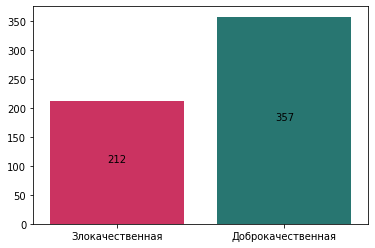

In [70]:
#import matplotlib.ticker as mticker

counts = df['diagnosis'].value_counts(ascending=True)
pos = range(len(counts))

ax = sns.countplot(df['diagnosis'])
for tick, label in zip(pos, ax.get_xticklabels()):
    plt.text(pos[tick], counts[tick] / 2 + 1, counts[tick], horizontalalignment='center', size='medium', color='black')

plt.xlabel('')
plt.ylabel('')
#ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, pos:  "Злокачественная" if x == 0 else "Доброкачественная"))

In [71]:
df['diagnosis'].value_counts(normalize=True)

Доброкачественная    0.627417
Злокачественная      0.372583
Name: diagnosis, dtype: float64

Если модель будет безусловно предсказывать доброкачественность новообразования для любых входных данных, то точность такой модели будет примерно равна 63%.
Это значение можно взять в качестве базовой линии при оценке качества обученной модели.

<a id="hist"></a>
### Гистограммы [⇑](#toc)

In [72]:
def plot_hist(offset, nrows=10, ncols=3):
    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 40))
    for i in range(offset, nrows * ncols + offset):
        sns.histplot(data=df, x=df[df.columns[i]], ax=ax[(i // ncols) % nrows][i % ncols], hue="diagnosis", kde=True)
        ax[(i // ncols) % nrows][i % ncols].set_ylabel('')
    plt.tight_layout()

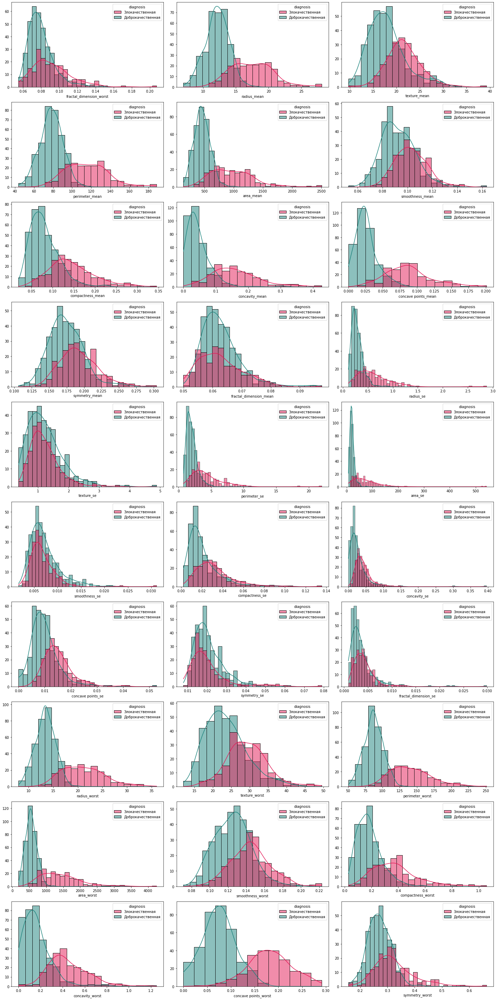

In [73]:
plot_hist(1)

Распределения выглядят почти нормальными, некоторые скорее логнормальными. <br>
Можно нормализовать распределения с помощью логарифмической трансформации.

<a id="corr"></a>
### Корреляция [⇑](#toc)

In [74]:
# Возвращает копию исходной матрицы с нулями на главной диагонали и в ячейках выше неё
def lower_triang(matrix):
    temp = matrix.copy()
    upper_triangle = np.triu(np.ones_like(matrix, dtype=bool), 1)
    temp = temp.where(upper_triangle == False, 0)
    np.fill_diagonal(temp.values, 0)
    return temp

# Печатает пары признаков с корреляцией больше заданного порога
# Возвращает список таких признаков
def corr_features_with_threshold(corr, trheshold):
    diag_corr = lower_triang(corr)
    corr_fields = []
    corr_pairs = []
    for i in diag_corr:
        for j in diag_corr.index[np.abs(diag_corr[i]) > trheshold]:
            if i == j:
                continue;
            if j not in corr_fields:
                corr_fields.append(j)
            if i not in corr_fields:
                corr_fields.append(i)
            corr_pairs.append((i,j))
            corr_coef = diag_corr[i][corr.index == j].values[0]
            print ("Признак", i, ("положительно" if corr_coef > 0 else "отрицательно"), "коррелирует с признаком", j, "с коэффициентом", corr_coef)
    return corr_fields, corr_pairs

# Печатает признаки, у которых коэффициент коррелации с заданным признаком больше заданного порога
# Возвращает список таких признаков
def corr_features_with_target_threshold(target, corr, threshold):
    corr_filter = np.abs(corr[target]) > threshold
    corr_fields = corr.columns[corr_filter].tolist()
    for f in corr_fields:
        if f == target:
            continue
        corr_coef = corr[target][f]
        print ("Признак", f, ("положительно" if corr_coef > 0 else "отрицательно"), "коррелирует с признаком", target, "с коэффициентом", corr_coef)
    return corr_fields

def plot_pairwise_correlation(corr_pair, data=df, hue="diagnosis"):
    g = sns.lmplot(x=corr_pair[0], y=corr_pair[1], hue=hue, data=data);
    g.fig.suptitle(f"Зависимость {corr_pair[1]} от {corr_pair[0]}", y=1.05)
    plt.show()

# Строит графики корреляций
def plot_correlations(corr_pairs):
    for c in corr_pairs:
        plot_pairwise_correlation(c)

<a id="heatmap"></a>
### Тепловая карта корреляций [⇑](#toc)

In [75]:
corr = df.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

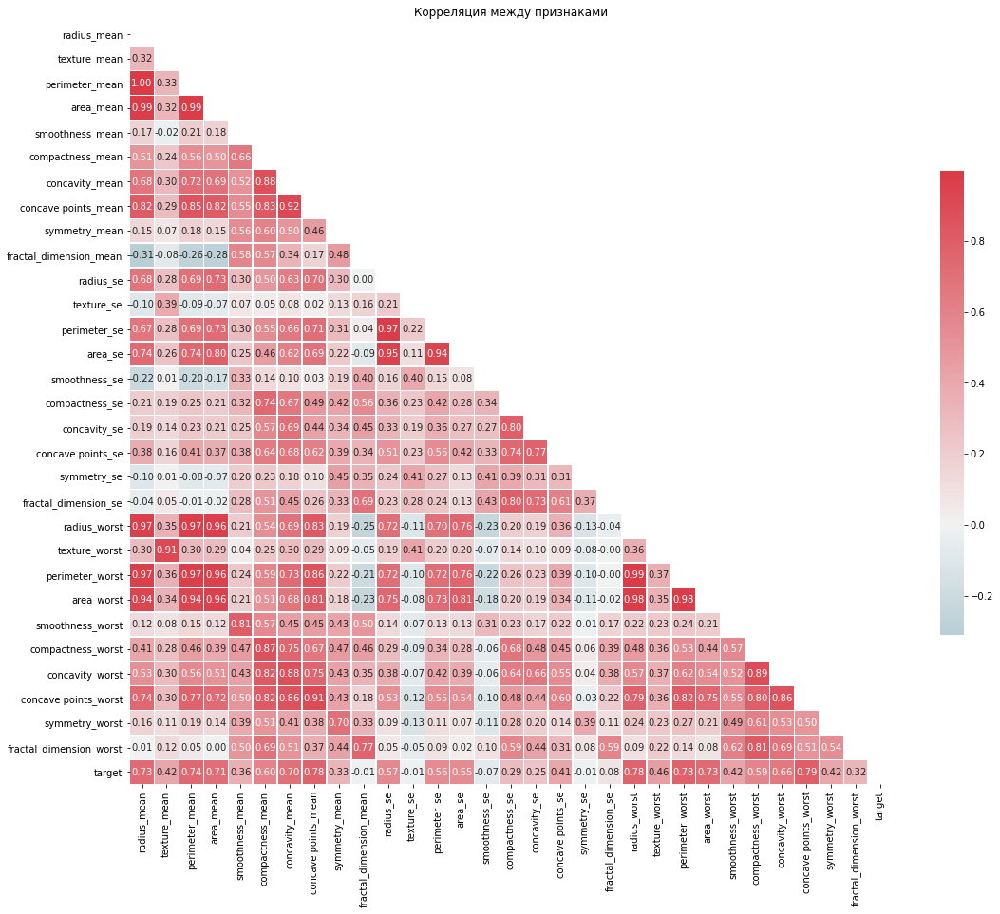

In [76]:
cmap = sns.diverging_palette(220, 10, as_cmap=True)
f, ax = plt.subplots(figsize=(18, 18))
sns.heatmap(corr, mask=mask, cmap=cmap, center=0, annot=True, square=True, fmt=".2f", linewidths=.5, cbar_kws={"shrink": .5}, ax=ax)
plt.title('Корреляция между признаками')
plt.show()

<a id="pairwise"></a>
### Попарно коррелирующие признаки [⇑](#toc)

In [77]:
corr_threshold = 0.85
corr_features, corr_pairs = corr_features_with_threshold(corr, corr_threshold)
corr_features.append('diagnosis')

Признак radius_mean положительно коррелирует с признаком perimeter_mean с коэффициентом 0.9978552814938113
Признак radius_mean положительно коррелирует с признаком area_mean с коэффициентом 0.9873571700566119
Признак radius_mean положительно коррелирует с признаком radius_worst с коэффициентом 0.9695389726112053
Признак radius_mean положительно коррелирует с признаком perimeter_worst с коэффициентом 0.9651365139559878
Признак radius_mean положительно коррелирует с признаком area_worst с коэффициентом 0.9410824595860459
Признак texture_mean положительно коррелирует с признаком texture_worst с коэффициентом 0.9120445888404215
Признак perimeter_mean положительно коррелирует с признаком area_mean с коэффициентом 0.9865068039913906
Признак perimeter_mean положительно коррелирует с признаком concave points_mean с коэффициентом 0.8509770412528199
Признак perimeter_mean положительно коррелирует с признаком radius_worst с коэффициентом 0.9694763634663142
Признак perimeter_mean положительно корр

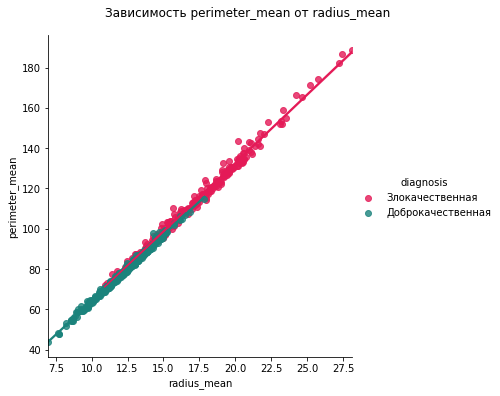

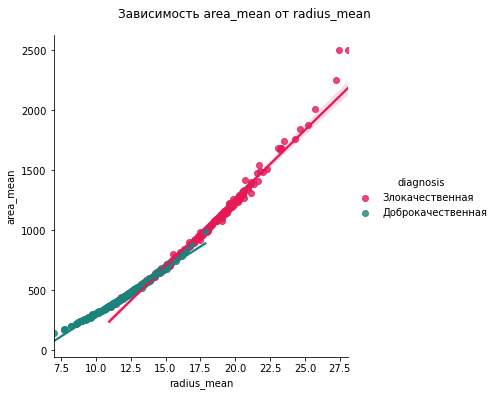

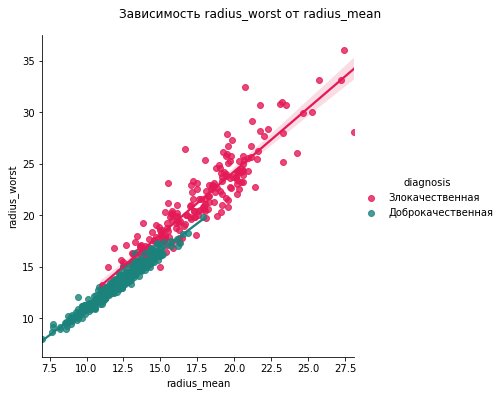

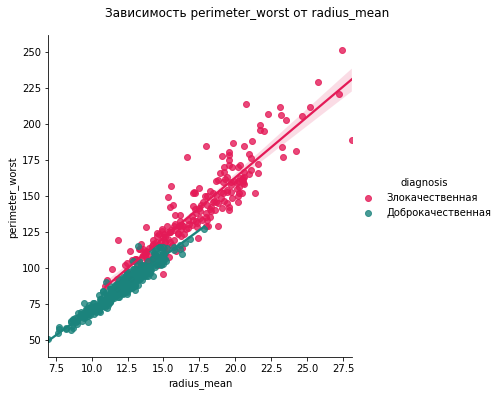

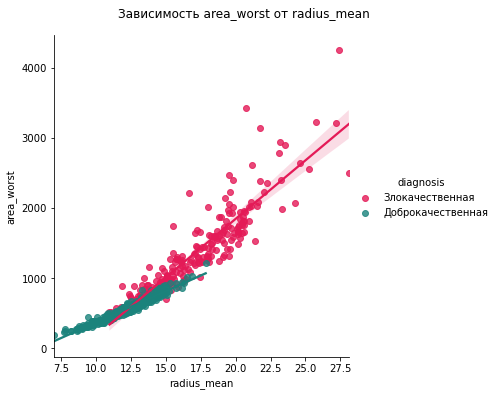

...

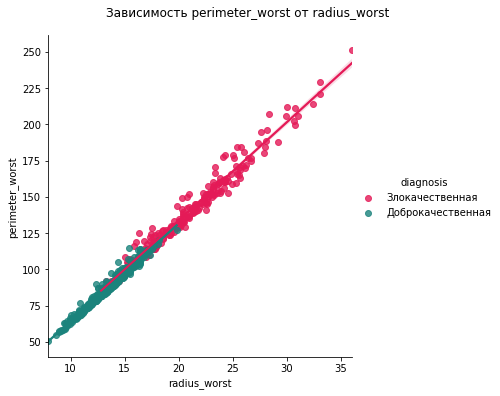

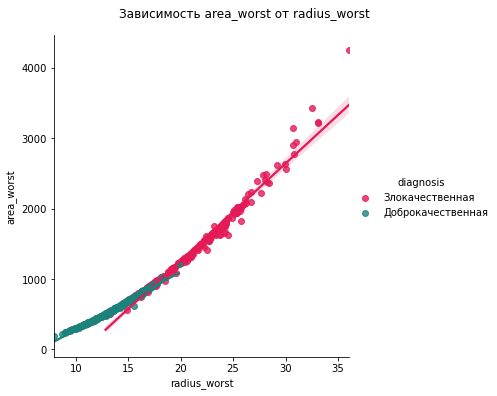

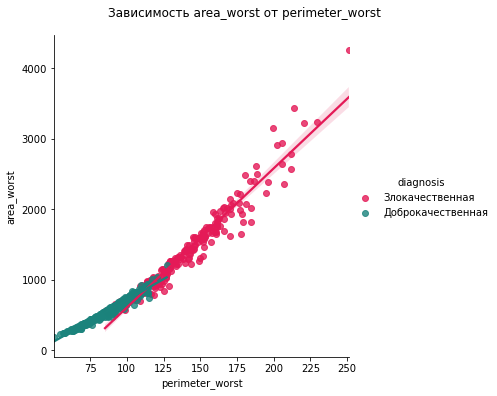

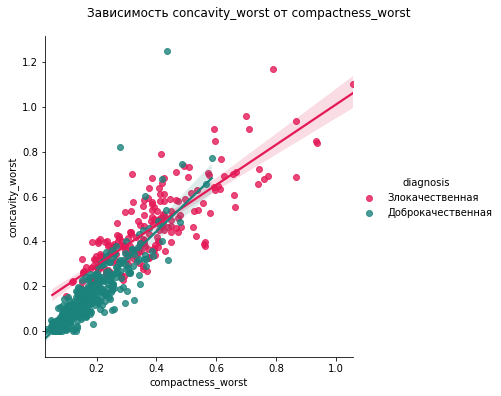

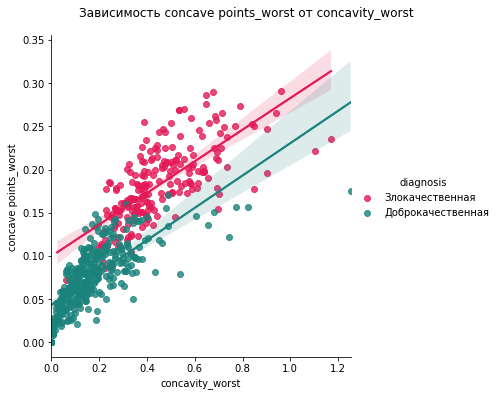

In [78]:
plot_correlations(corr_pairs)

Линейная зависимость между признаками с высокой корреляцией видна на графиках

<a id="target_corr"></a>
### Признаки коррелирующие с диагнозом [⇑](#toc)
Диагноз перекодирован как целочисленный фактор, где 1 - это злокачественность.<br>
Можно попробовать найти признаки, у которых корреляция с перекодированным диагнозом больше некоторого порога.<br>
Найденные признаки можно попробовать в качестве отобранных признаков для обучения модели классификатора.

In [79]:
# Находим признаки коррелирующие с перекодированнай целевой переменной
# Рассчитываем для них корреляционную матрицу
corr_threshold = 0.70
corr_diagnosis_features = corr_features_with_target_threshold("target", corr, corr_threshold)
corr_diagnosis = df[corr_diagnosis_features].corr()

Признак radius_mean положительно коррелирует с признаком target с коэффициентом 0.7300285113754569
Признак perimeter_mean положительно коррелирует с признаком target с коэффициентом 0.742635529725833
Признак area_mean положительно коррелирует с признаком target с коэффициентом 0.7089838365853909
Признак concave points_mean положительно коррелирует с признаком target с коэффициентом 0.7766138400204361
Признак radius_worst положительно коррелирует с признаком target с коэффициентом 0.7764537785950388
Признак perimeter_worst положительно коррелирует с признаком target с коэффициентом 0.782914137173759
Признак area_worst положительно коррелирует с признаком target с коэффициентом 0.7338250349210516
Признак concave points_worst положительно коррелирует с признаком target с коэффициентом 0.7935660171412696


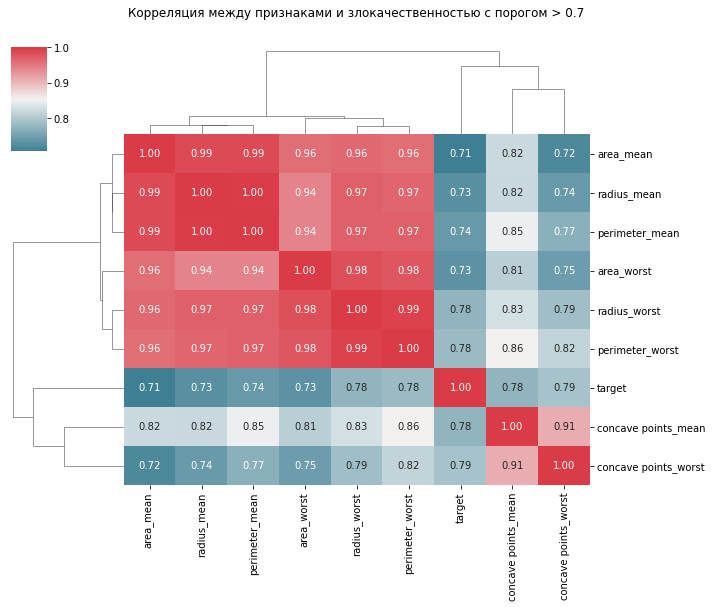

In [80]:
g = sns.clustermap(corr_diagnosis, method="single", cmap=cmap, annot=True, fmt=".2f", figsize=(10, 8))
g.fig.suptitle(f"Корреляция между признаками и злокачественностью с порогом > {corr_threshold}", y=1.05)
plt.show()

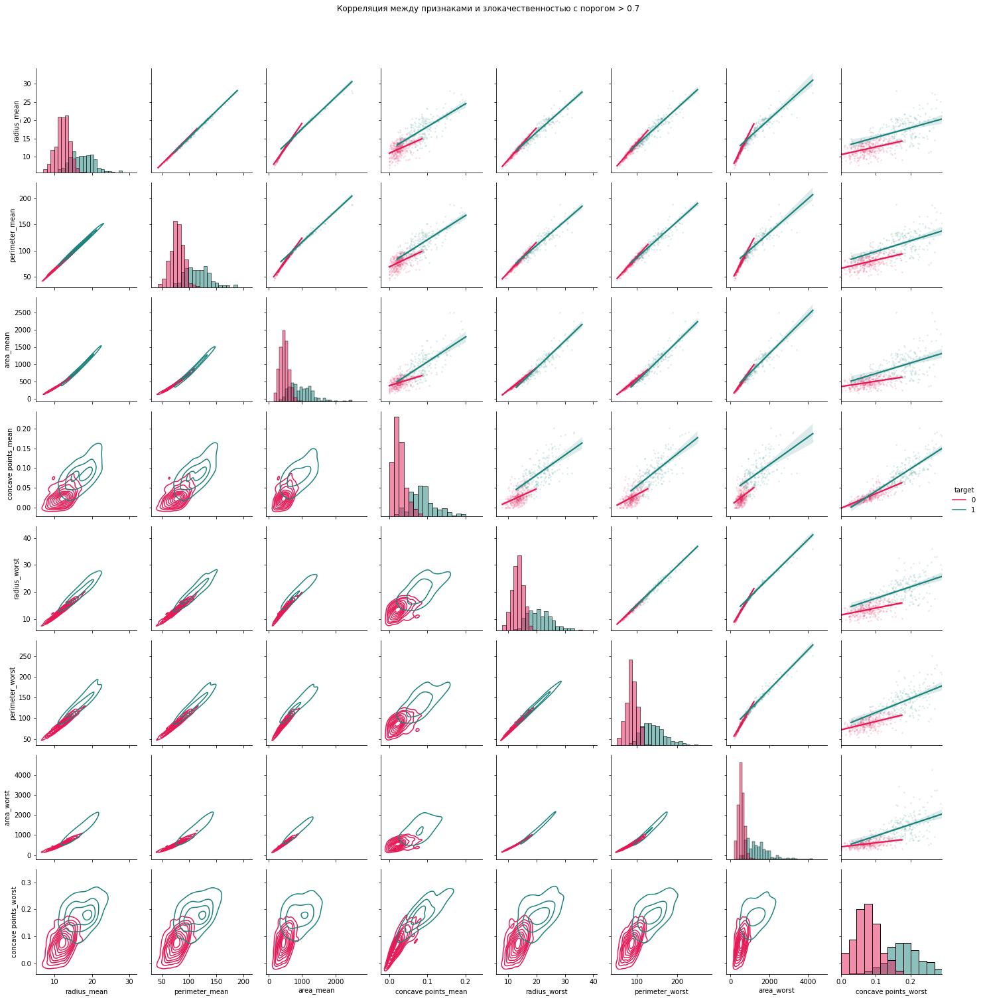

In [81]:
g = sns.PairGrid(df[corr_diagnosis_features], hue="target")
g.map_upper(sns.regplot, scatter_kws = {'alpha': 0.1,'s':3})
g.map_lower(sns.kdeplot)
g.map_diag(sns.histplot)
g.add_legend()
g.fig.suptitle(f"Корреляция между признаками и злокачественностью с порогом > {corr_threshold}", y=1.05)
plt.show()

<a id="boxes"></a>
### Размахи [⇑](#toc)

In [82]:
def plot_boxes_for(features, add_jitter=True):
    scaler = StandardScaler()
    feat_scaled = pd.DataFrame(scaler.fit_transform(df[features]), columns=features, index = df.index)
    data = pd.concat([df['diagnosis'], feat_scaled], axis=1)
    df_melt = pd.melt(frame=data, value_vars=features, id_vars=["diagnosis"])
    fig, ax = plt.subplots(1, 1, figsize = (15, 8), dpi=300)
    sns.boxplot(x="variable", y="value", hue="diagnosis", data=df_melt, dodge=True)
    if add_jitter:
        sns.stripplot(x='variable', y='value', hue="diagnosis", split=True, data=df_melt, linewidth=1, alpha=.5, dodge=True, jitter=0.2, size=2.5)
    plt.xticks(rotation=90)
    plt.ylabel('')
    plt.xlabel('')

    handles, labels = ax.get_legend_handles_labels()
    L=plt.legend(handles[0:2], labels[0:2])
    #L.get_texts()[0].set_text('Доброкачественная')
    #L.get_texts()[1].set_text('Злокачественная')

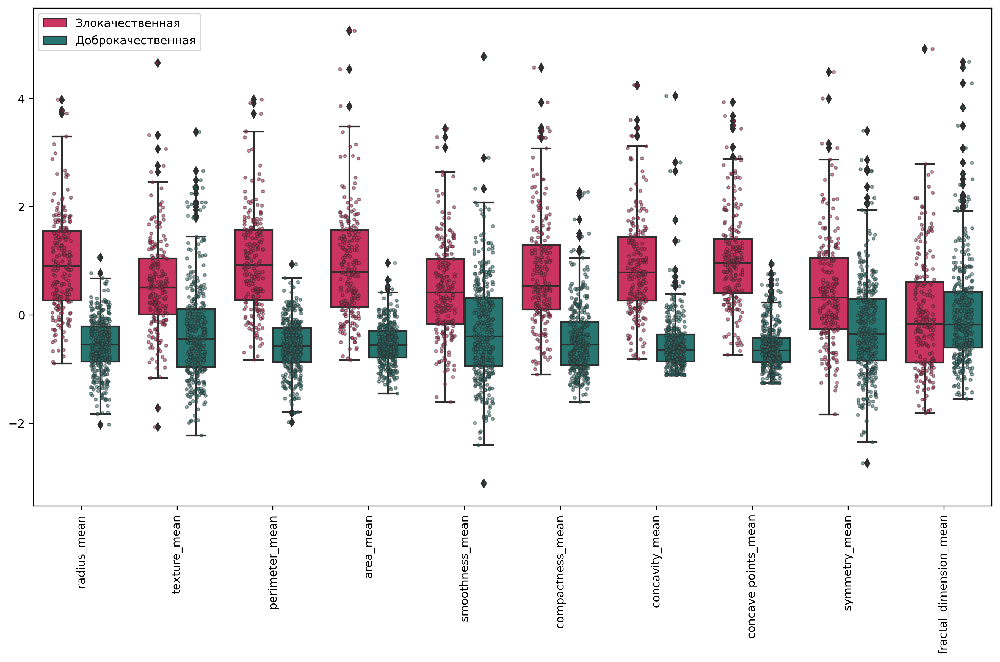

In [83]:
plot_boxes_for(means)

Медианы *Злокачественных* и *Доброкачественных* результатов измерений для признаков **radius_mean**, **texture_mean**, **perimeter_mean**, **area_mean**, **compactness_mean**, **concavity_mean**, **concave_points_mean** далеко отстоят друг от друга. Cоответственно данные признаки должны хорошо влиять на классификацию.<br><br>
Медианы *Злокачественных* и *Доброкачественных* результатов измерений для **fractal_dimension_mean** практически совпадают, поэтому данный признак будет только мешать при классификации.
<br><br>
Распределения признаков **concavity_mean**, **concave_points_mean** очень похожи друг на друга, скорее всего эти признаки имеют высокую положительную корреляцию.

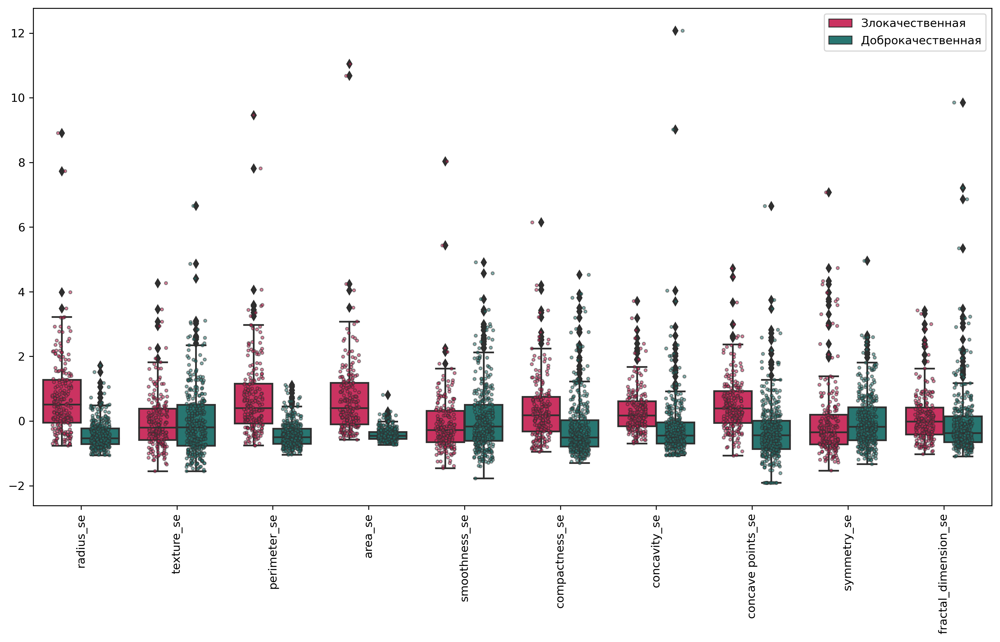

In [84]:
plot_boxes_for(se)

Признаки **radius_se**, **perimeter_se**, **area_se**, **concavity_se**, **concave_points_se** хорошо разделяются на классы.

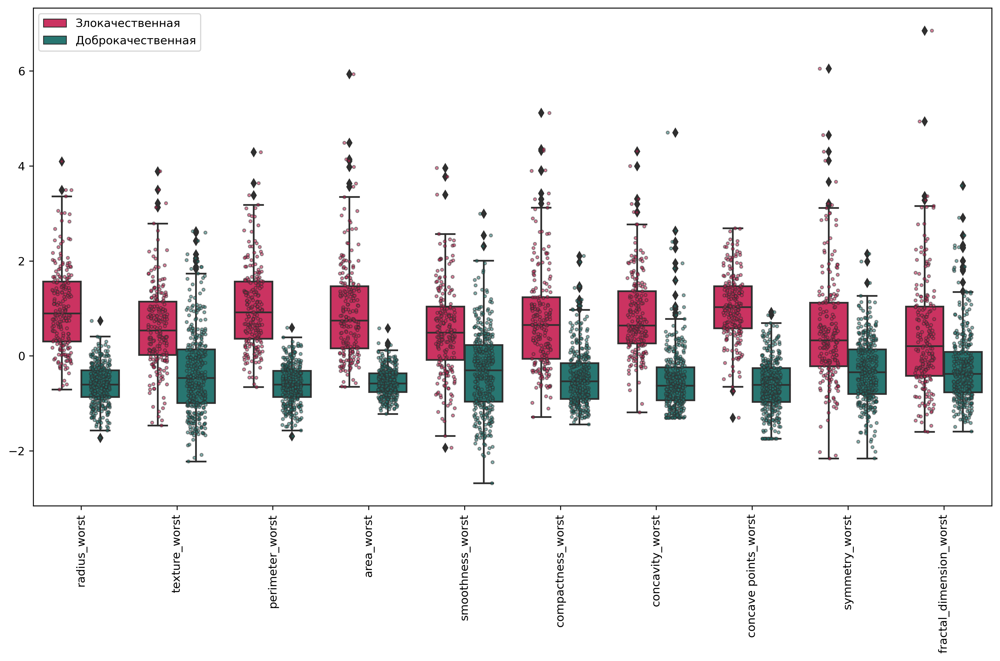

In [85]:
plot_boxes_for(worst)

Признаки **radius_worst**, **texture_worst**, **perimeter_worst**, **area_worst**, **compactness_worst**, **concavity_worst**, **concave_points_worst** хорошо разделяются на классы.

<a id="swarms"></a>
### Визуализация разделения признаков по классам [⇑](#toc)

In [86]:
def plot_swarm_for(features):
    scaler = StandardScaler()
    feat_scaled = pd.DataFrame(scaler.fit_transform(df[features]), columns=features, index = df.index)
    data = pd.concat([df['diagnosis'], feat_scaled], axis=1)
    df_melt = pd.melt(frame=data, value_vars=features, id_vars=["diagnosis"])
    fig, ax = plt.subplots(1, 1, figsize = (15, 8), dpi=300)
    sns.swarmplot(x="variable", y="value", hue="diagnosis", data=df_melt)
    plt.xticks(rotation=90)
    plt.ylabel('')
    plt.xlabel('')
    L=plt.legend()
    L.get_texts()[0].set_text('Доброкачественная')
    L.get_texts()[1].set_text('Злокачественная')

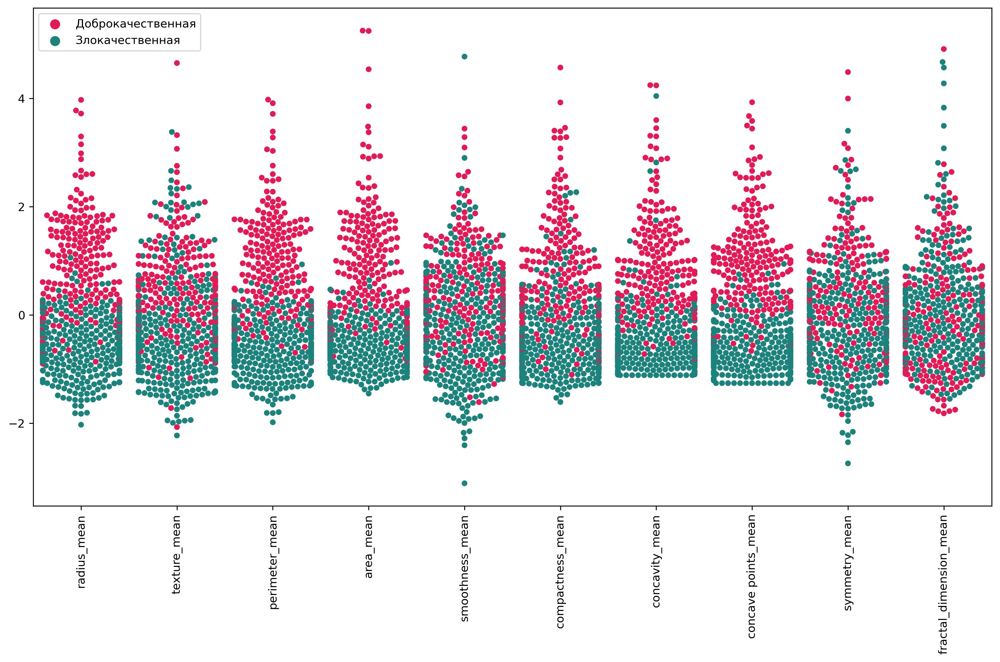

In [87]:
plot_swarm_for(means)

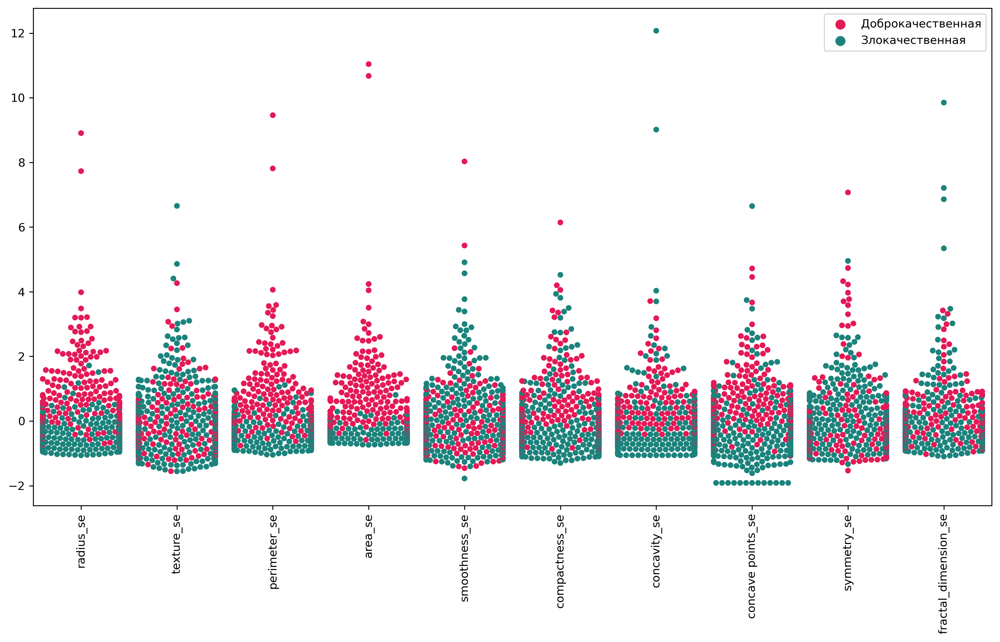

In [88]:
plot_swarm_for(se)

Признак **area_se** практически идеально разделяет образцы по классам.

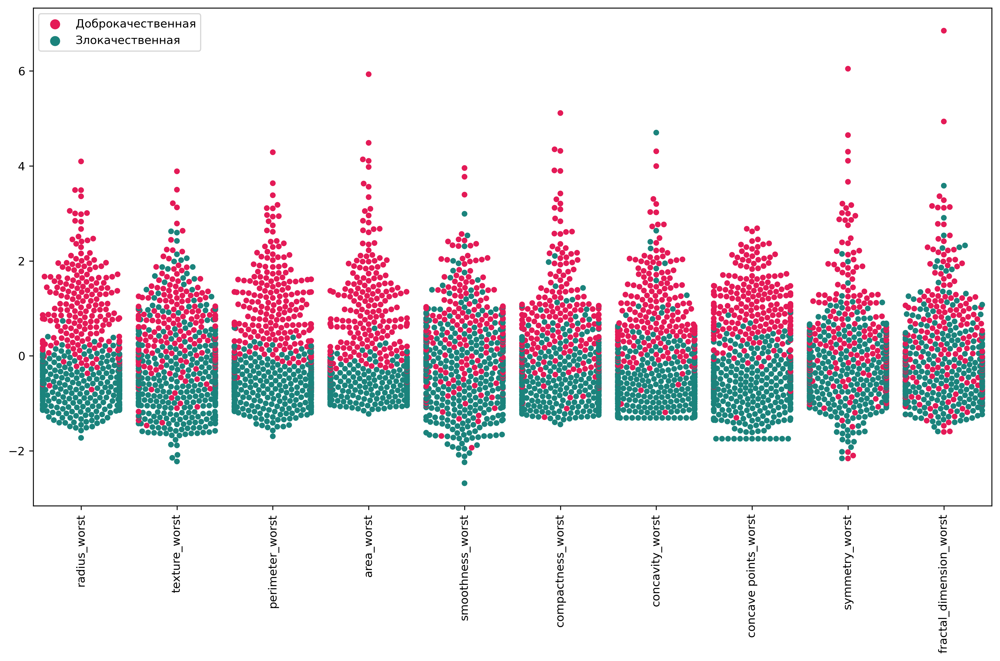

In [89]:
plot_swarm_for(worst)

<a id="class"></a>
# Классификация [⇑](#toc)

In [92]:
X = df.drop(['diagnosis', 'target'], axis=1)
y = df['target']

<a id="norm"></a>
### Нормализация данных [⇑](#toc)

Гистограммы скошены вправо, для нормализации распределения признаков
использую логарифмическую трансформацию.

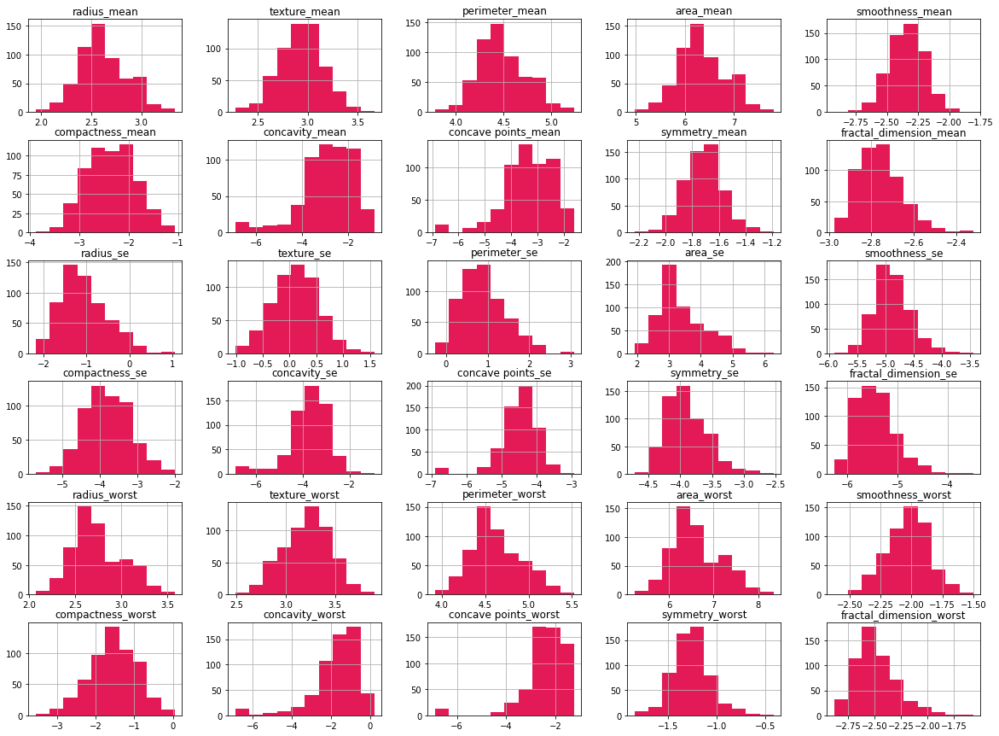

In [94]:
X_log = np.log(X+0.001)
X_log.hist(figsize=(20, 15));
plt.show()

<a id="split"></a>
### Разбиение данных на тестовую и обучающую выборки [⇑](#toc)

Используем стратификацию разбиения по целевой переменной, <br>
так как количество доброкачественных тестов в выборке более чем в полтора раза <br>
превышает количество злокачественных тестов. <br>

Если не использовать стратификацию, то при случайном отборе в обучающую выборку могут попасть например данные только одного класса,<br>
тогда наблюдения из другого класса, лежащие недалеко от "хорошей" границы класса могут неверно предсказываться.

In [95]:
X_train, X_test, y_train, y_test = train_test_split(
    X_log, y, test_size=0.30, random_state=42, stratify=y
)

In [96]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((398, 30), (171, 30), (398,), (171,))

In [97]:
y_train.value_counts(normalize=True)

0    0.628141
1    0.371859
Name: target, dtype: float64

In [98]:
y_test.value_counts(normalize=True)

0    0.625731
1    0.374269
Name: target, dtype: float64

<a id="scale"></a>
### Стандартизация данных [⇑](#toc)

In [279]:
def plot_parallel_coord(normalize):
    data = None

    if normalize:
        X = df.drop(['diagnosis', 'target'], axis=1)
        X_log = np.log(X + 0.00001)
        scaler = StandardScaler()
        feat_scaled = pd.DataFrame(scaler.fit_transform(X_log), columns=X_log.columns, index = X_log.index)
        data = pd.concat([df['diagnosis'], feat_scaled], axis=1)
    else:
        data = df.drop("target", axis=1)
    
    plt.figure(figsize=(20,10))
    parallel_coordinates(data, "diagnosis", colormap=cmap)
    plt.xlabel('')
    #plt.ylabel('Значения признаков', fontsize=15)
    plt.title(f'{("Нормализованные" if normalize else "Ненормализованные")} данные')
    plt.xticks(rotation=90)
    plt.legend(loc=1, prop={'size': 15}, frameon=True, facecolor="white", edgecolor="black")
    plt.show()

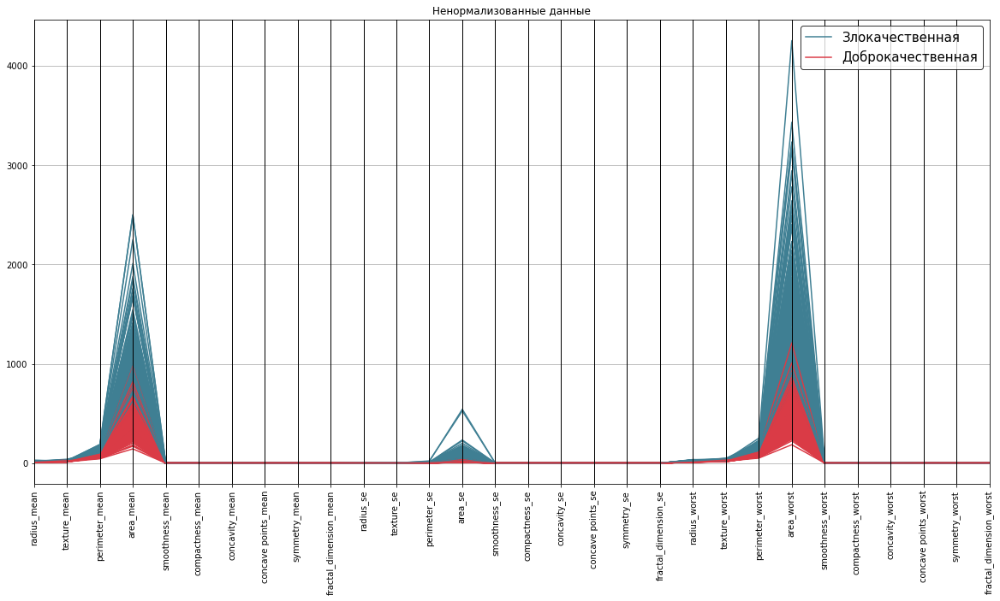

In [280]:
plot_parallel_coord(normalize=False)

Абсолютные значения признаков распределены неравномерно.<br>
Максимальное значение в 300 раз превышает минимальное.<br>
Если не провести нормализацию данных, то вклад признаков с небольшими абсолютными значениями будет мало различим для классификатора.<br>
Скорее всего классификатор будет разделять классы только по признакам area_* в то время как графики распределения признаков показывают, что признаки,<br>
связанные с периметром и радиусом также хорошо разделяются между классами.

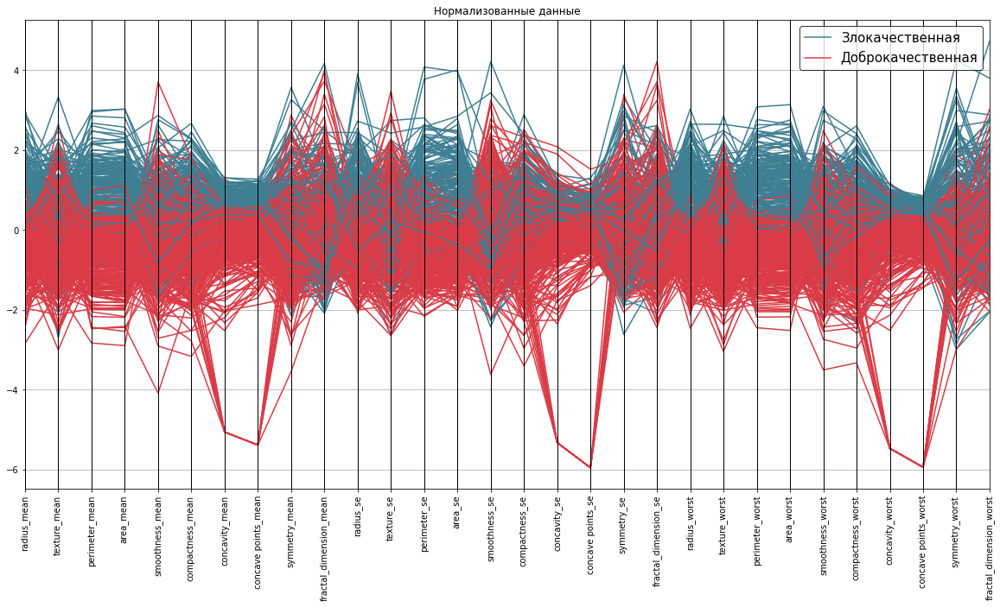

In [281]:
plot_parallel_coord(normalize=True)

Нормализую данные методом Z-масштабирования.<br>
Нормировщик должен обучаться на тренировочной выборке, чтобы информация о тестовой выбоке не просачивалась в тренировочную.<br>
Применяем нормировщик уже к тестовой выборке.

In [101]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

<a id="code"></a>
### Метрики [⇑](#toc)

In [264]:
def calc_metrics(y_pred, y_true):
    accuracy  = accuracy_score(y_pred, y_true)
    precision = precision_score(y_pred, y_true)
    recall    = recall_score(y_pred, y_true)
    f1        = f1_score(y_pred, y_true)
    return accuracy, precision, recall, f1
    
def quality_report(y_pred_train, y_train, y_pred_test, y_test, test_roc, train_roc):
    from IPython.display import display, HTML
    
    train = list(calc_metrics(y_pred_train, y_train))
    train.append(train_roc)
    test = list(calc_metrics(y_pred_test, y_test))
    test.append(test_roc)
    report = pd.DataFrame(np.array([test, train]), columns=['Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC'])
    report = report.T
    report.columns = ['Тестовая выборка', 'Тренировочная выборка']
    
    display(HTML(report.to_html(float_format='{:.3f}'.format)))
   
    return report

def plot_roc_and_confusion(knn):
    def plot_roc_curve(prediction_prob, y_true, ax, kind):
        fpr, tpr, thresholds = roc_curve(y_true, prediction_prob)
        auc_score = roc_auc_score(y_true, prediction_prob)
        
        ax.plot(fpr, tpr, label='ROC curve ')
        ax.plot([0, 1], [0, 1])
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])
        ax.set_xlabel('False Positive Rate')
        ax.set_ylabel('True Positive Rate')
        ax.set_title(f'ROC AUC: {auc_score:.3f} — {kind}')
        return auc_score
    
    from matplotlib.gridspec import GridSpec
    
    fig = plt.figure(constrained_layout=False, figsize=(18, 7))
    
    gs = GridSpec(2, 4, figure=fig)
    ct_ax    = fig.add_subplot(gs[0, 0])
    ctn_ax   = fig.add_subplot(gs[1, 0])
    ctr_ax   = fig.add_subplot(gs[0, 1])
    ctrn_ax  = fig.add_subplot(gs[1, 1])
    roct_ax  = fig.add_subplot(gs[0, 2:])
    roctr_ax = fig.add_subplot(gs[1, 2:])

    plot_confusion_matrix(knn, X_test_scaled,  y_test,  ax=ct_ax)
    plot_confusion_matrix(knn, X_test_scaled,  y_test,  ax=ctn_ax,  normalize='true')
    plot_confusion_matrix(knn, X_train_scaled, y_train, ax=ctr_ax)
    plot_confusion_matrix(knn, X_train_scaled, y_train, ax=ctrn_ax, normalize='true')
    
    ctr_ax.set_title('Тренировочная выборка')
    ct_ax.set_title('Тестовая выборка')
    
    ct_ax.set_xlabel('')
    ctr_ax.set_xlabel('')
    ctr_ax.set_ylabel('')
    ctrn_ax.set_ylabel('')
   
    test_roc = plot_roc_curve(knn.predict_proba(X_test_scaled)[:,1], y_test, roct_ax, 'Тестовая выборка')
    train_roc = plot_roc_curve(knn.predict_proba(X_train_scaled)[:,1], y_train, roctr_ax, 'Тренировочная выборка')
    
    roct_ax.set_xlabel('')
    
    plt.tight_layout()
    plt.show()
    
    return test_roc, train_roc

def knn_classify(knn):
    knn.fit(X_train_scaled, y_train)
    y_pred_train = knn.predict(X_train_scaled)
    y_pred_test  = knn.predict(X_test_scaled)
    test_roc, train_roc = plot_roc_and_confusion(knn)
    report = quality_report(y_pred_train, y_train, y_pred_test, y_test, test_roc, train_roc)
    return report

<a id="naive"></a>
### kNN без подбора гиперпараметров [⇑](#toc)

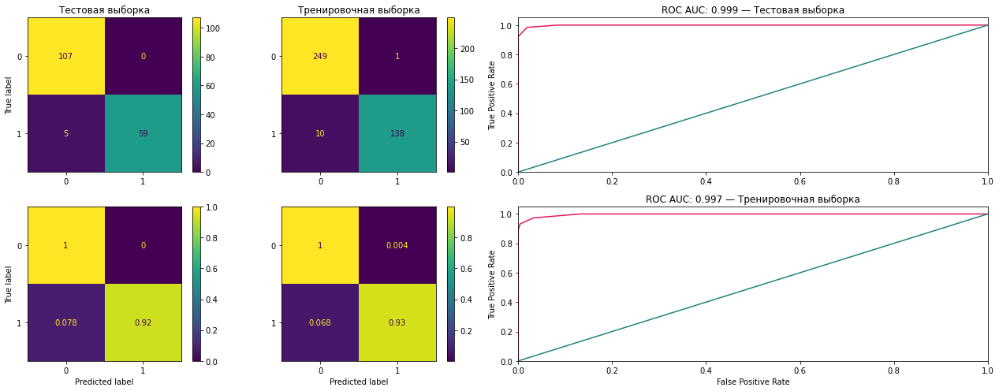

,Тестовая выборка,Тренировочная выборка
Accuracy,0.971,0.972
Precision,0.922,0.932
Recall,1.000,0.993
F1-score,0.959,0.962
ROC AUC,0.999,0.997


In [271]:
knn = KNeighborsClassifier()
report_naive = knn_classify(knn)

<a id="cv"></a>
### Подбор числа соседей с помощью кросс-валидации [⇑](#toc)

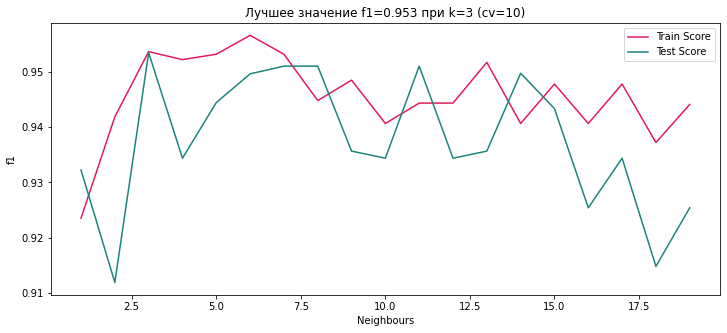

In [241]:
cv_neighbors = list(range(1, 20))
cv_metric='f1'
cv_folds=10

test_cv_scores = []
train_cv_scores = []

for k in cv_neighbors:
    knn = KNeighborsClassifier(n_neighbors=k)
    train_cv_scores.append(cross_val_score(knn, X_train_scaled, y_train, cv=cv_folds, scoring=cv_metric).mean())
    test_cv_scores.append(cross_val_score(knn, X_test_scaled, y_test, cv=cv_folds, scoring=cv_metric).mean())

test_cv_scores = np.array(test_cv_scores)
train_cv_scores = np.array(train_cv_scores)
    
best_k = test_cv_scores.argmax() + 1
best_score = test_cv_scores.max()

plt.figure(figsize=(12,5))
p = sns.lineplot(cv_neighbors, train_cv_scores, label='Train Score')
p = sns.lineplot(cv_neighbors, test_cv_scores, label='Test Score')
plt.title(f"Лучшее значение {cv_metric}={best_score:.3f} при k={best_k} (cv={cv_folds})")
plt.xlabel("Neighbours")
plt.ylabel(cv_metric)
plt.show()

### kNN после подбора числа соседей с помощью кросс-валидации [⇑](#toc)

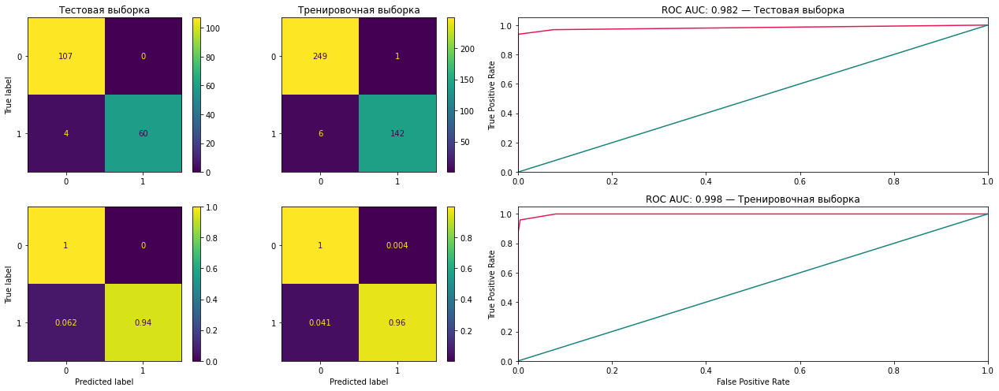

,Тестовая выборка,Тренировочная выборка
Accuracy,0.977,0.982
Precision,0.938,0.959
Recall,1.000,0.993
F1-score,0.968,0.976
ROC AUC,0.982,0.998


In [269]:
knn_cv = KNeighborsClassifier(n_neighbors=best_k)
report_cv = knn_classify(knn_cv)

<a id="gcv"></a>
### Настройка гиперпараметров с помощью GridSearchCV [⇑](#toc)

In [245]:
%%time

param_grid = {
        'n_neighbors': cv_neighbors,
        'p': range(1, 4),
        'weights':['uniform', 'distance']
}

knn_gcv = KNeighborsClassifier()

grid_search = GridSearchCV(knn_gcv, param_grid, cv=cv_folds, scoring=cv_metric, verbose=0)
grid_search.fit(X_train_scaled, y_train)

knn_gcv = grid_search.best_estimator_

print(f"Лучшее значение {cv_metric}={grid_search.best_score_:.3f} при k={knn_gcv.n_neighbors}, p={knn_gcv.p}, weights={knn_gcv.weights} (cv={cv_folds})")

Лучшее значение f1=0.960 при k=5, p=3, weights=uniform (cv=10)
Wall time: 30.7 s


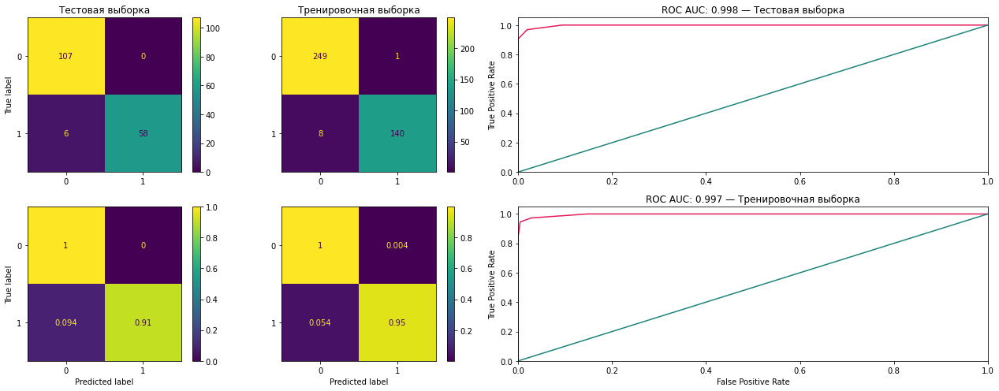

,Тестовая выборка,Тренировочная выборка
Accuracy,0.965,0.977
Precision,0.906,0.946
Recall,1.000,0.993
F1-score,0.951,0.969
ROC AUC,0.998,0.997


In [268]:
report_gcv = knn_classify(grid_search.best_estimator_)

In [272]:
report_naive

,Тестовая выборка,Тренировочная выборка
Accuracy,0.970760,0.972362
Precision,0.921875,0.932432
Recall,1.000000,0.992806
F1-score,0.959350,0.961672
ROC AUC,0.998613,0.996973


In [273]:
report_cv

,Тестовая выборка,Тренировочная выборка
Accuracy,0.976608,0.982412
Precision,0.937500,0.959459
Recall,1.000000,0.993007
F1-score,0.967742,0.975945
ROC AUC,0.982039,0.998135


In [274]:
report_gcv

,Тестовая выборка,Тренировочная выборка
Accuracy,0.964912,0.977387
Precision,0.906250,0.945946
Recall,1.000000,0.992908
F1-score,0.950820,0.968858
ROC AUC,0.997664,0.997000


На данном наборе данных классификация методом k ближайших соседей с параметрами заданными по умолчанию оказалась совсем не хуже чем
классификация моделью с подобранными гиперпараметрами.